#### PCA tomography on combined spectra

In [9]:
import json
from pca_cleaning import SpectralPCA
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from astropy.table import Table
from astropy.wcs import WCS

In [16]:
with open("sci_files_object_mapping.json", "r") as f:
    sci_files_object_mapping = json.load(f)

import numpy as np
from astropy.io import fits
from astropy.wcs import WCS


def get_wl(filename, redshift):
    # Abrir o arquivo FITS e obter o cabeçalho e os dados
    header = fits.getheader(filename, ext=("sci", 1))
    data = fits.getdata(filename, ext=("sci", 1))

    # Criar o objeto WCS a partir do cabeçalho
    wcs = WCS(header, naxis=[1])

    # Obter o número de pixels na dimensão espectral (assumindo que está no eixo 1)
    num_pixels = data.shape[1]

    # Gerar a sequência de pixels e convertê-los para comprimentos de onda
    wavelength = wcs.wcs_pix2world(np.arange(num_pixels), 0)[0]

    # Aplicar a correção do redshift
    corrected_wl = wavelength / (1 + redshift)

    return corrected_wl

In [13]:
# This function is designed to aid the creation of a emission line mask.
# It plots the sum of all spectra and other 10 points of the IFU, showing where we are making cuts


def inspect_velocity_redshift_emission(
    source,
    wl,
    mdf,
    emission_lines: list,
    delta,
):
    beams = [408, 419, 69, 269, 469, 669, 658, 458, 258, 58]
    nbeamplots = len(beams)  # number of beams to plot
    nplots = (
        nbeamplots + 1
    )  # total number of plots is the number of beams selected + 1 (the first plot is the sum of all beams)
    plot_heigth = nplots * 5
    fig, ax = plt.subplots(
        nrows=nplots, ncols=1, figsize=(60, plot_heigth), sharex=False
    )

    # Define a granularidade de marcações no eixo x
    xticks = np.arange(wl.min(), wl.max(), 100)

    signal = np.nansum(source, axis=0)
    signal_mean = np.mean(signal)
    signal_std = np.std(signal)
    ax[0].plot(wl, np.clip(signal, None, signal_mean + 2.5 * signal_std))
    ax[0].set_title("Sum of all spectra")
    ax[0].set_xticks(xticks)

    # Make a lookup table from the MDF to know which row in the matrix represent each beam
    mdf_table = Table(mdf)
    source_mdf = mdf_table[mdf_table["BEAM"] == 1]
    target_beams_mdf = source_mdf[np.isin(source_mdf["NO"], beams)]

    for beam_seq, beam_id in enumerate(beams):
        beam_row_index = np.where(target_beams_mdf["NO"] == beam_id)[0]
        plot_index = beam_seq + 1
        ax[plot_index].plot(wl, source[beam_row_index].flatten())  # Garantir que é 1D
        ax[plot_index].set_title(f"Signal of beam {beam_id}")
        ax[plot_index].set_xticks(xticks)

    for line_wl in emission_lines:
        for figure in ax:
            figure.axvline(line_wl - delta, ls="dashed", color="red", lw=0.6)
            figure.axvline(line_wl + delta, ls="dashed", color="orange", lw=0.6)

    plt.show()

### GSN 069

In [18]:
emission_lines = [
    4340.46,  # Hγ
    4363.21,  # [O III]
    4471.5,  # He I
    4685.68,  # He II
    4861.33,  # Hβ
    4958.91,  # [O III]
    5006.84,  # [O III]
    5875.6,  # He I
    6300.30,  # [O I]
    6363.78,  # [O I]
    6548.05,  # [N II]
    6562.79,  # Hα
    6583.45,  # [N II]
    6716.44,  # [S II]
    6730.82,  # [S II]
    7135.8,  # [Ar III]
]

observed_absortion_windows = [
    (4124, 4150),
    (4282, 4317),
    (4370, 4421),
    (4515, 4592),
    (5028, 5050),
    (5070, 5135),
    (5161, 5193),
    (5247, 5287),
    (5314, 5354),
    (5390, 5417),
    (5698, 5722),
    (5938, 5995),
    (6050, 6073),
]

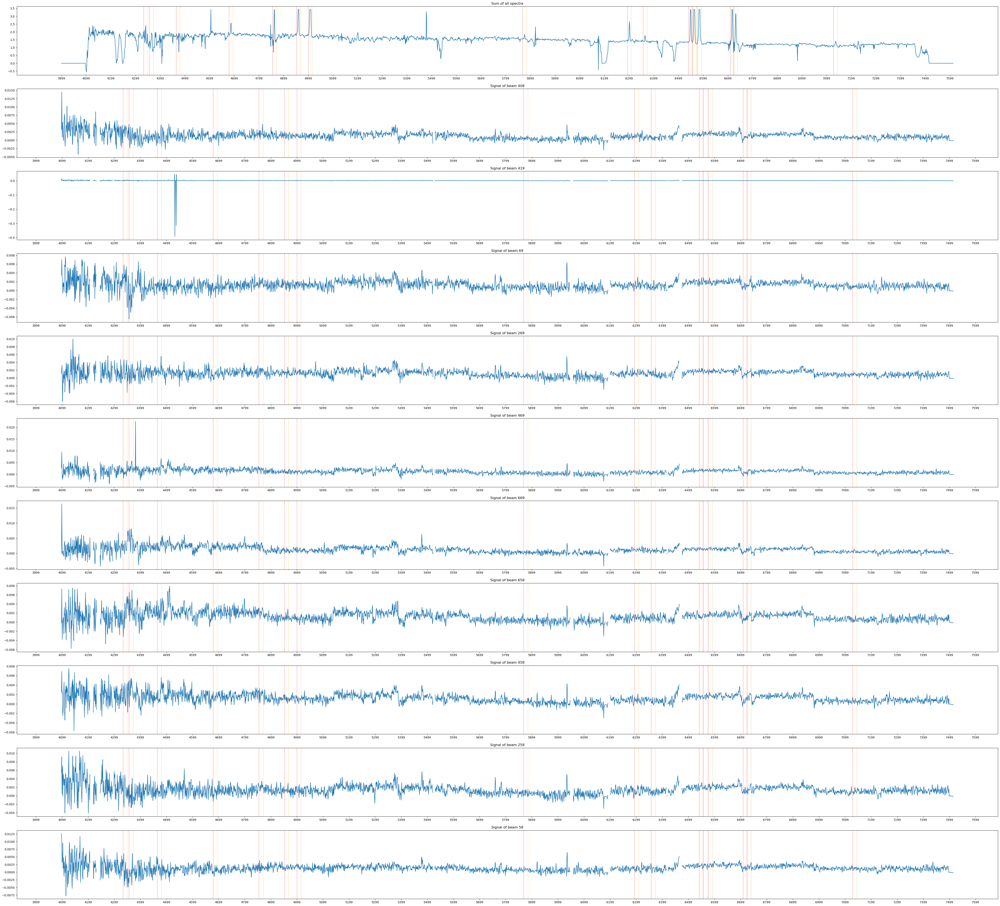

In [19]:
object_name = list(sci_files_object_mapping.keys())[0]
name = object_name.replace(" ", "").lower()
filename = f"redux/{name}_combined_spectra_ext.fits"
redshift = 0.018
delta = 8

with fits.open(filename) as hdul:
    science = hdul["SCI"].data
    mdf = hdul["MDF"].data

wl = get_wl(filename, redshift)

delta = 8
inspect_velocity_redshift_emission(science, wl, mdf, emission_lines, delta)

In [20]:
pca_selection_criteria = "selection_index"


data = SpectralPCA(
    filename,
    redshift,
    emission_lines,
    delta,

    observed_absortion_windows,
)



data.pca_decompose()



data.luminosity_component_correlation(pca_selection_criteria)

x2     17285.195185
x3       283.282612
x1       211.727570
x4        29.386170
x6         3.263031
x14        1.288342
x9         0.941640
x15        0.259249
x16        0.210055
x5         0.168123
x8         0.134896
x10        0.128468
x17        0.127468
x7         0.082166
x13        0.074821
x18        0.047647
x19        0.046034
x11        0.033638
x20        0.001242
x12        0.000246
Name: selection_index, dtype: float64


In [21]:
selection_threshold = 0.08
data.subtract_bad_components(selection_threshold)

Removing components: [12, 17, 18, 10, 19, 11]


In [22]:
stepfilter3 = data.StepSignalRemoval(3)
stepfilter3.calculate_and_subtract_step_signal(1726.965142774873, 3.25)
step_signal3 = stepfilter3.bad_signal

stepfilter2 = data.StepSignalRemoval(2)
stepfilter2.calculate_and_subtract_step_signal(1716.404884951783, 1.5)
step_signal2 = stepfilter2.bad_signal

stepfilter4 = data.StepSignalRemoval(4)
stepfilter4.calculate_and_subtract_step_signal(1703.75, 0)
step_signal4 = stepfilter4.bad_signal

stepfilter5 = data.StepSignalRemoval(5)
stepfilter5.calculate_and_subtract_step_signal(1703.75, 0)
step_signal5 = stepfilter5.bad_signal

stepfilter8 = data.StepSignalRemoval(8)
stepfilter8.calculate_and_subtract_step_signal(1694.375, 0)
step_signal8 = stepfilter8.bad_signal

step_total = step_signal2 + step_signal3 + step_signal4 + step_signal5 + step_signal8
step_free_source = data.noise_subtracted_source - step_total

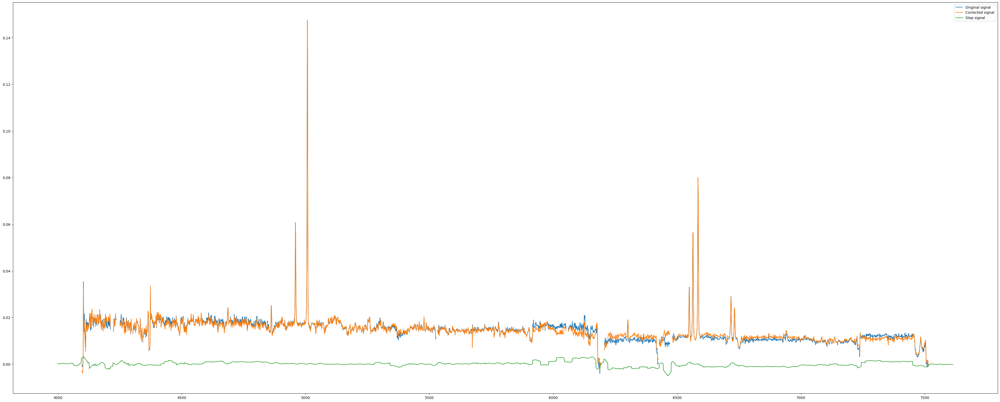

In [23]:
beam = 37
plt.figure(figsize=(50, 20))
plt.plot(
    data.corrected_wl,  # [: len(sythetic_data)],
    data.noise_subtracted_source[beam],  # [: len(sythetic_data)],
    label="Original signal",
)
plt.plot(
    data.corrected_wl,  # [: len(sythetic_data)],
    step_free_source[beam],  # [: len(sythetic_data)],
    label="Corrected signal",
)
plt.plot(
    data.corrected_wl,  # [: len(sythetic_data)],
    step_total[beam],  # [: len(sythetic_data)],
    label="Step signal",
)
plt.legend()

plt.show()

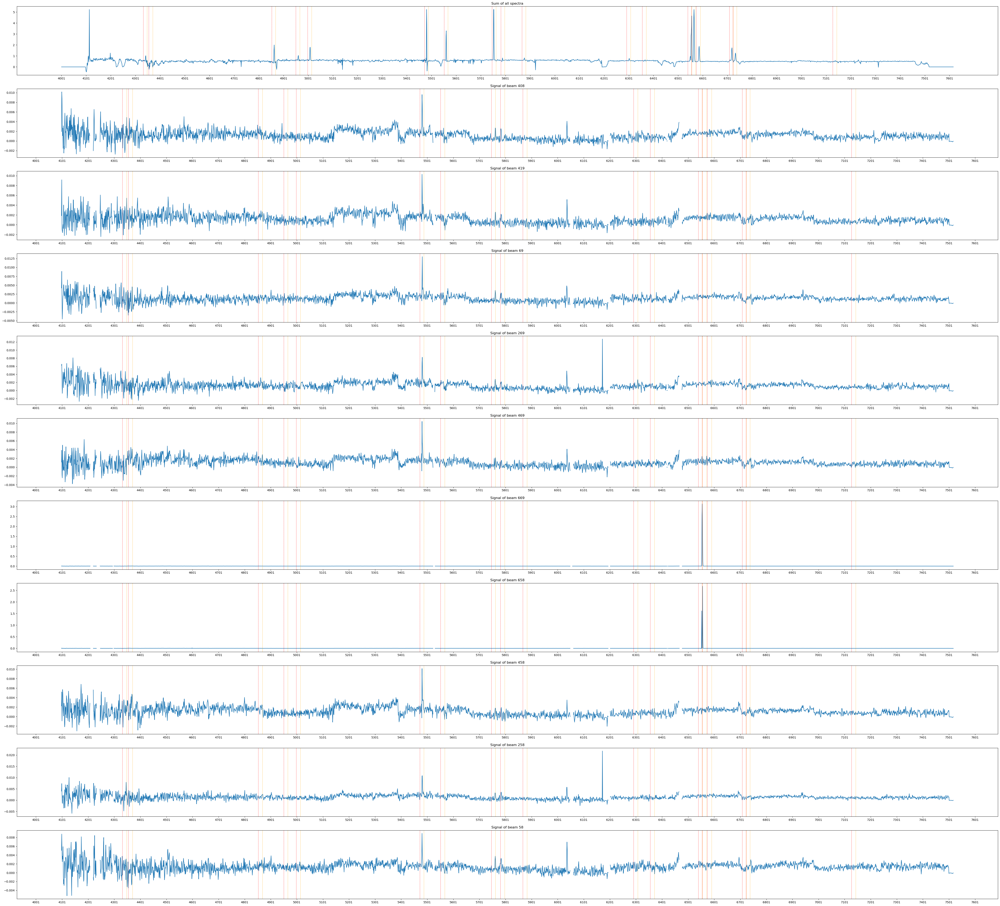

In [ ]:
from astropy.io import fits

emission_lines = [
    4340.46,  # Hγ
    4363.21,  # [O III]
    4861.33,  # Hβ
    4958.91,  # [O III]
    5006.84,  # [O III]
    5480.5,  # [?]
    5560,
    5754.595,  # [N II]
    5790,
    5875.6,  # [He I]
    6300.30,  # [O I]
    6363.78,  # [O I]
    6548.05,  # [N II]
    6562.79,  # Hα
    6583.45,  # [N II]
    6716.44,  # [S II]
    6730.82,  # [S II]
    7135.8,  # [Ar III]
    # 7230,
]

with fits.open(filename) as hdul:
    science = hdul["SCI"].data
    mdf = hdul["MDF"].data

delta = 8
inspect_velocity_redshift_emission(
    science, data.corrected_wl, mdf, emission_lines, delta
)

### eRO-QPE2

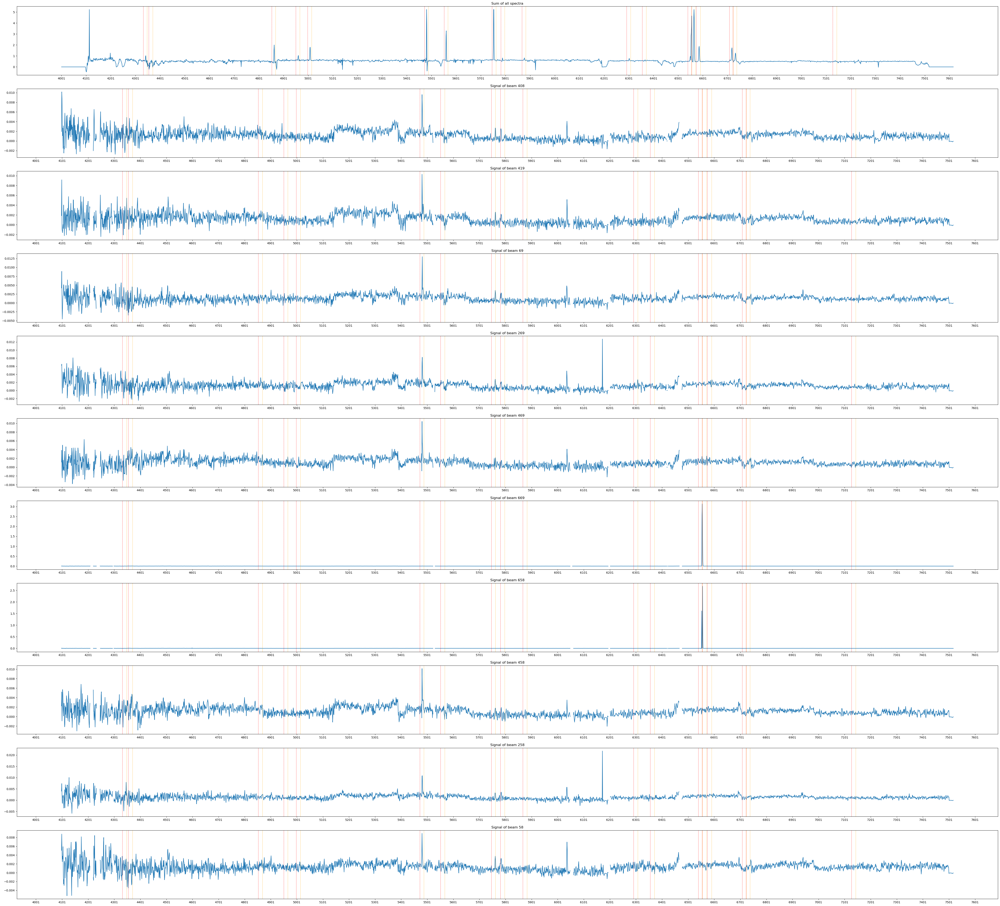

In [27]:
object_name = list(sci_files_object_mapping.keys())[1]
name = object_name.replace(" ", "").lower()
filename = f"redux/{name}_combined_spectra_ext.fits"
redshift = 0.0175
delta = 8

with fits.open(filename) as hdul:
    science = hdul["SCI"].data
    mdf = hdul["MDF"].data

wl = get_wl(filename, redshift)

delta = 8

emission_lines = [
    4340.46,  # Hγ
    4363.21,  # [O III]
    4861.33,  # Hβ
    4958.91,  # [O III]
    5006.84,  # [O III]
    5480.5,  # [?]
    5560,
    5754.595,  # [N II]
    5790,
    5875.6,  # [He I]
    6300.30,  # [O I]
    6363.78,  # [O I]
    6548.05,  # [N II]
    6562.79,  # Hα
    6583.45,  # [N II]
    6716.44,  # [S II]
    6730.82,  # [S II]
    7135.8,  # [Ar III]
    # 7230,
]

inspect_velocity_redshift_emission(science, wl, mdf, emission_lines, delta)

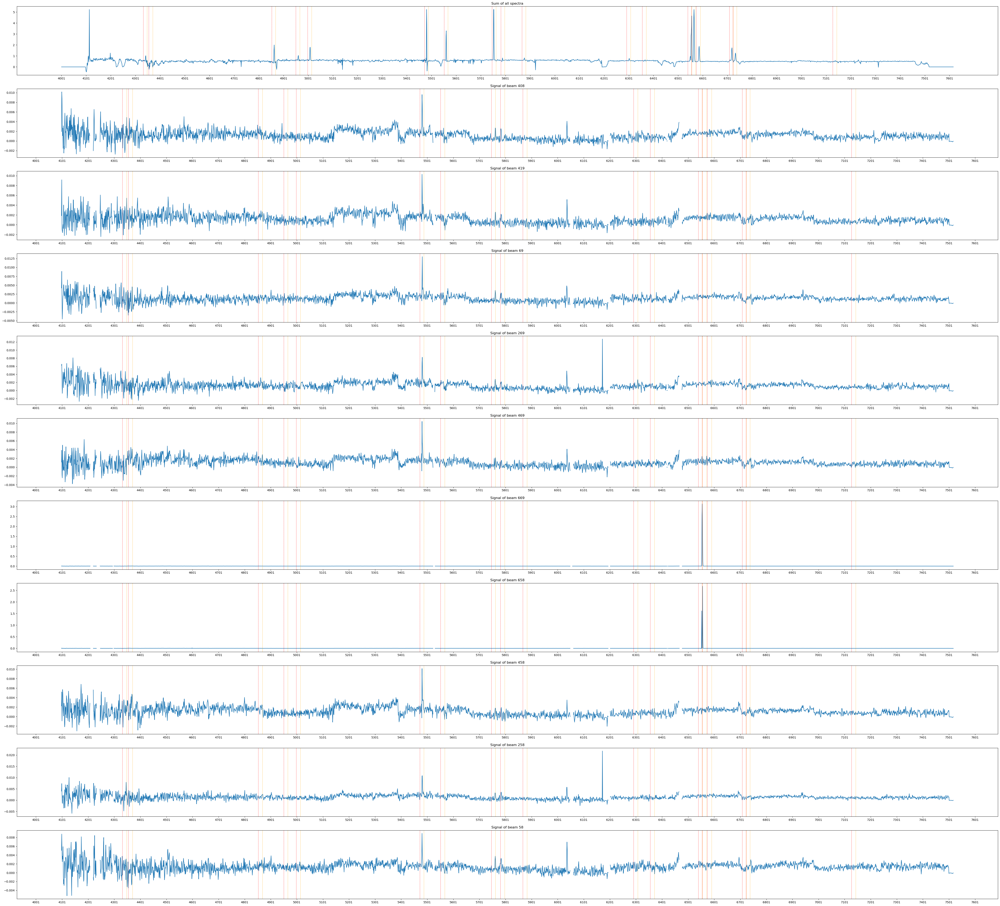

In [45]:
from astropy.io import fits

emission_lines = [
    4340.46,  # Hγ
    4363.21,  # [O III]
    4861.33,  # Hβ
    4958.91,  # [O III]
    5006.84,  # [O III]
    5480.5,  # [?]
    5560,
    5754.595,  # [N II]
    5790,
    5875.6,  # [He I]
    6300.30,  # [O I]
    6363.78,  # [O I]
    6548.05,  # [N II]
    6562.79,  # Hα
    6583.45,  # [N II]
    6716.44,  # [S II]
    6730.82,  # [S II]
    7135.8,  # [Ar III]
    # 7230,
]

with fits.open(filename) as hdul:
    science = hdul["SCI"].data
    mdf = hdul["MDF"].data

delta = 8
inspect_velocity_redshift_emission(
    science, data.corrected_wl, mdf, emission_lines, delta
)

In [ ]:
pca_selection_criteria = "selection_index"


data = SpectralPCA(
    filename,
    redshift,
    emission_lines,
    delta,
    observed_absortion_windows,
)

data.pca_decompose()

data.luminosity_component_correlation(pca_selection_criteria)